In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Verificar que las rutas sean correctas
print("Ruta completa del archivo de entrenamiento:", os.path.join(train_dir, '_classes.csv'))
print("Ruta completa del archivo de validación:", os.path.join(validation_dir, '_classes.csv'))
print("Ruta completa del archivo de prueba:", os.path.join(test_dir, '_classes.csv'))

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))  # Ajuste a 416x416
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.float32)


# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Función para mostrar imágenes y etiquetas
def show_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.permute(1, 2, 0)  # Cambiar el orden de las dimensiones para matplotlib
        axes[i].imshow(image)
        if isinstance(label, torch.Tensor):
            label_str = ', '.join([str(l.item()) for l in label]) if label.numel() > 1 else str(label.item())
        else:
            label_str = str(label)
        axes[i].set_title(f'Label(s): {label_str}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
show_images(train_dataset)

# Mostrar algunas imágenes del conjunto de validación
show_images(val_dataset)

# Mostrar algunas imágenes del conjunto de prueba
show_images(test_dataset)


KeyboardInterrupt: 

Defino la CNN

In [37]:
import torch
import torch.nn as nn
#cada canal matriz 3 rgb 
#capa denza a la entrada con relu  
#capa denza al final 10  con softmax como funcion de activacion

class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(128 * 28 * 28, 128)  # Ajusta 28*28 según tu tamaño de imagen
        self.fc2 = nn.Linear(128, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = self.pool(nn.functional.relu(self.conv3(x)))
        x = x.view(-1, 128 * 28 * 28)  # Aplanar para la capa totalmente conectada
        x = nn.functional.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


# Instanciar el modelo
num_classes = train_labels.shape[1]  # Asumiendo que train_labels es numpy array con las etiquetas
model = CustomCNN(num_classes)

# Mostrar un resumen del modelo
print(model)



CustomCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=100352, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


defino mas parametros como el numero de clases en la cnn

entreno la cnn

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# Definir el modelo
num_classes = 10  # Ajustar según tu dataset

# Definir el modelo
model = CustomCNN(num_classes=num_classes)

# Definir la función de pérdida y el optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Ejemplo de entrenamiento
num_epochs = 1

for epoch in range(num_epochs):
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        inputs, labels = data

        # Resetear gradientes
        optimizer.zero_grad()

        # Forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Mostrar estadísticas
        running_loss += loss.item()
        if i % 100 == 99:    # Imprimir cada 100 mini-lotes
            print(f'Epoch [{epoch + 1}, {i + 1}], Loss: {running_loss / 100:.3f}')
            running_loss = 0.0

# Calcular precisión en el conjunto de entrenamiento
correct = 0
total = 0
with torch.no_grad():
    for images, labels in train_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

train_accuracy = correct / total
print(f'Accuracy on training set: {100 * train_accuracy:.2f}%')

# Calcular precisión en el conjunto de validación
correct_val = 0
total_val = 0
with torch.no_grad():
    for images_val, labels_val in val_loader:
        outputs_val = model(images_val)
        _, predicted_val = torch.max(outputs_val, 1)
        total_val += labels_val.size(0)
        correct_val += (predicted_val == labels_val).sum().item()

val_accuracy = correct_val / total_val
print(f'Accuracy on validation set: {100 * val_accuracy:.2f}%')



In [41]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F

# Definición del modelo
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(16 * 112 * 112, 1)  # Ajusta la salida a un solo canal
    
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(-1, 16 * 112 * 112)
        x = self.fc1(x)
        return x

# Crear el modelo, criterio de pérdida y optimizador
net = SimpleCNN()
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Suponiendo que ya tienes definidas las DataLoader
# train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Ciclo de entrenamiento
for epoch in range(2):  # Número de épocas
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        inputs, targets = data
        optimizer.zero_grad()
        
        # Forward pass
        outputs = net(inputs)
        
        # Asegurarse de que las dimensiones coincidan
        targets = targets.view(-1, 1).float()
        
        # Calcular la pérdida
        loss = criterion(outputs, targets)
        
        # Backward pass y optimización
        loss.backward()
        optimizer.step()
        
        # Imprimir estadísticas de pérdida
        running_loss += loss.item()
        if i % 100 == 99:    # Imprimir cada 100 mini-batches
            print(f'Epoch {epoch + 1}, Batch {i + 1}, Loss: {running_loss / 100:.3f}')
            running_loss = 0.0

print('Finished Training')

# Guardar el modelo entrenado
torch.save(net.state_dict(), 'model.pth')


c:\Users\ferch\OneDrive\Documentos\Fer\facultad TODO\tesis\cnnsApp\env\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([320, 1])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (32) must match the size of tensor b (320) at non-singleton dimension 0

EMPIEZO DE NUEVO

In [45]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Verificar que las rutas sean correctas
print("Ruta completa del archivo de entrenamiento:", os.path.join(train_dir, '_classes.csv'))
print("Ruta completa del archivo de validación:", os.path.join(validation_dir, '_classes.csv'))
print("Ruta completa del archivo de prueba:", os.path.join(test_dir, '_classes.csv'))

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))  # Cambiar tamaño a 416x416
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.float32)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definición del modelo
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(16 * 208 * 208, 1)  # Ajusta la salida a un solo canal
    
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(x.size(0), -1)  # Asegura que el tamaño del lote se mantenga
        x = self.fc1(x)
        return x

# Crear el modelo, criterio de pérdida y optimizador
net = SimpleCNN()
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Ciclo de entrenamiento
for epoch in range(2):  # Número de épocas
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        inputs, targets = data
        optimizer.zero_grad()
        
        # Forward pass
        outputs = net(inputs)
        
        # Asegurarse de que las dimensiones coincidan
        targets = targets.view(-1, 1).float()
        
        # Calcular la pérdida
        loss = criterion(outputs, targets)
        
        # Backward pass y optimización
        loss.backward()
        optimizer.step()
        
        # Imprimir estadísticas de pérdida
        running_loss += loss.item()
        if i % 100 == 99:    # Imprimir cada 100 mini-batches
            print(f'Epoch {epoch + 1}, Batch {i + 1}, Loss: {running_loss / 100:.3f}')
            running_loss = 0.0

print('Finished Training')

# Guardar el modelo entrenado
torch.save(net.state_dict(), 'model.pth')

# Función para mostrar imágenes y etiquetas
def show_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.permute(1, 2, 0)  # Cambiar el orden de las dimensiones para matplotlib
        axes[i].imshow(image)
        if isinstance(label, torch.Tensor):
            label_str = ', '.join([str(l.item()) for l in label]) if label.numel() > 1 else str(label.item())
        else:
            label_str = str(label)
        axes[i].set_title(f'Label(s): {label_str}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
show_images(train_dataset)

# Mostrar algunas imágenes del conjunto de validación
show_images(val_dataset)

# Mostrar algunas imágenes del conjunto de prueba
show_images(test_dataset)


Ruta completa del archivo de entrenamiento: ./train\_classes.csv
Ruta completa del archivo de validación: ./valid\_classes.csv
Ruta completa del archivo de prueba: ./test\_classes.csv


c:\Users\ferch\OneDrive\Documentos\Fer\facultad TODO\tesis\cnnsApp\env\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([320, 1])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (32) must match the size of tensor b (320) at non-singleton dimension 0

Ruta completa del archivo de entrenamiento: ./train\_classes.csv
Ruta completa del archivo de validación: ./valid\_classes.csv
Ruta completa del archivo de prueba: ./test\_classes.csv
Número de clases: 10
Finished Training


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


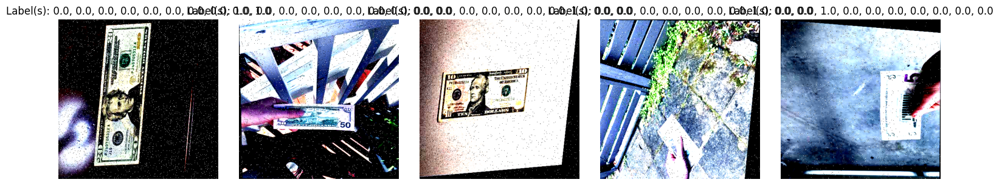

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..2.4285715].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8081232..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.2739873].


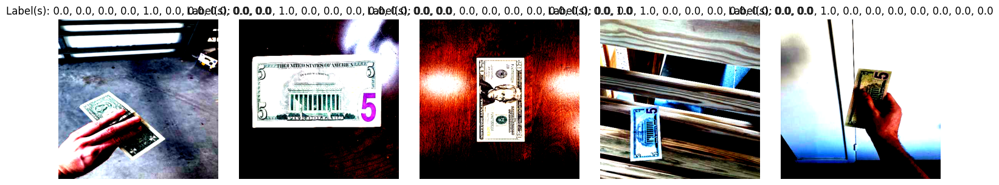

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.3060222].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4831376].


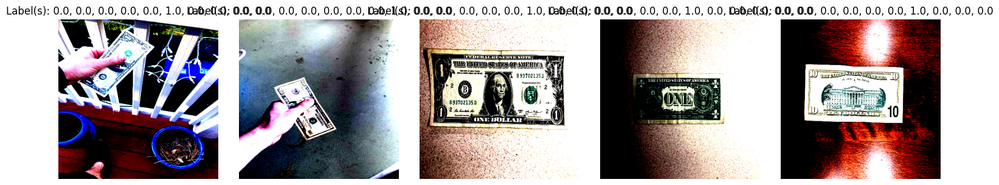

In [46]:
#este anda hasta entrenar!!!
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels, df.columns[1:]  # Retorna también los nombres de las clases

# Verificar que las rutas sean correctas
print("Ruta completa del archivo de entrenamiento:", os.path.join(train_dir, '_classes.csv'))
print("Ruta completa del archivo de validación:", os.path.join(validation_dir, '_classes.csv'))
print("Ruta completa del archivo de prueba:", os.path.join(test_dir, '_classes.csv'))

# Cargar etiquetas
train_filenames, train_labels, class_names = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels, _ = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels, _ = load_labels(os.path.join(test_dir, '_classes.csv'))

# Obtener el número de clases
num_classes = len(class_names)
print(f'Número de clases: {num_classes}')

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))  # Cambiar tamaño a 416x416
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.float32)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definición del modelo
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(16 * 208 * 208, num_classes)  # Ajusta la salida a num_classes
    
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(x.size(0), -1)  # Asegura que el tamaño del lote se mantenga
        x = self.fc1(x)
        return x

# Crear el modelo, criterio de pérdida y optimizador
net = SimpleCNN(num_classes=num_classes)
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Ciclo de entrenamiento
for epoch in range(2):  # Número de épocas
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        inputs, targets = data
        optimizer.zero_grad()
        
        # Forward pass
        outputs = net(inputs)
        
        # Asegurarse de que las dimensiones coincidan
        targets = targets.view(outputs.size(0), -1).float()  # Asegurar que las etiquetas coincidan con la salida del modelo
        
        # Calcular la pérdida
        loss = criterion(outputs, targets)
        
        # Backward pass y optimización
        loss.backward()
        optimizer.step()
        
        # Imprimir estadísticas de pérdida
        running_loss += loss.item()
        if i % 100 == 99:    # Imprimir cada 100 mini-batches
            print(f'Epoch {epoch + 1}, Batch {i + 1}, Loss: {running_loss / 100:.3f}')
            running_loss = 0.0

print('Finished Training')

# Guardar el modelo entrenado
torch.save(net.state_dict(), 'model.pth')

# Función para mostrar imágenes y etiquetas
def show_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.permute(1, 2, 0)  # Cambiar el orden de las dimensiones para matplotlib
        axes[i].imshow(image)
        if isinstance(label, torch.Tensor):
            label_str = ', '.join([str(l.item()) for l in label]) if label.numel() > 1 else str(label.item())
        else:
            label_str = str(label)
        axes[i].set_title(f'Label(s): {label_str}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
show_images(train_dataset)

# Mostrar algunas imágenes del conjunto de validación
show_images(val_dataset)

# Mostrar algunas imágenes del conjunto de prueba
show_images(test_dataset)



Ruta completa del archivo de entrenamiento: ./train\_classes.csv
Ruta completa del archivo de validación: ./valid\_classes.csv
Ruta completa del archivo de prueba: ./test\_classes.csv
Número de clases: 10
Epoch 1, Batch 100, Loss: nan
Epoch 1, Batch 200, Loss: nan
Epoch 2, Batch 100, Loss: nan
Epoch 2, Batch 200, Loss: nan
Finished Training
Accuracy on test set: 0.00%


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


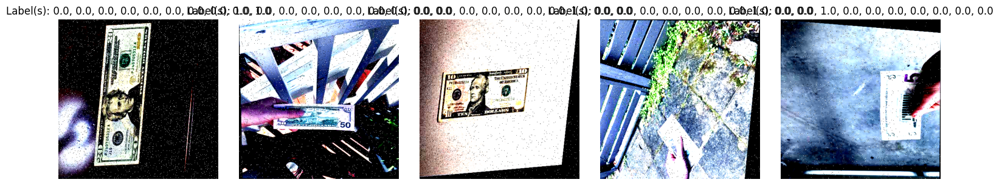

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..2.4285715].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8081232..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.2739873].


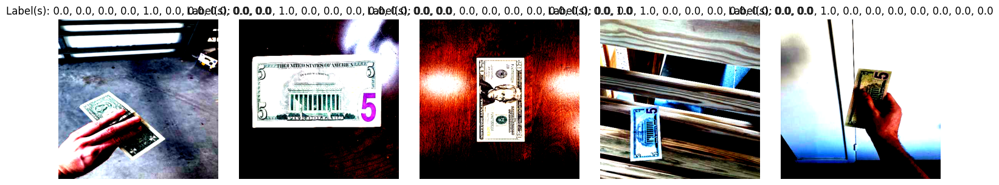

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.3060222].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4831376].


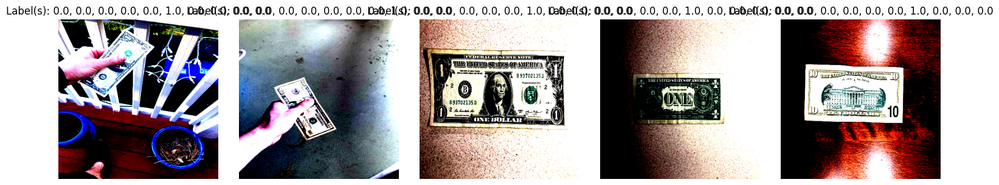

In [57]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels, df.columns[1:]  # Retorna también los nombres de las clases

# Verificar que las rutas sean correctas
print("Ruta completa del archivo de entrenamiento:", os.path.join(train_dir, '_classes.csv'))
print("Ruta completa del archivo de validación:", os.path.join(validation_dir, '_classes.csv'))
print("Ruta completa del archivo de prueba:", os.path.join(test_dir, '_classes.csv'))

# Cargar etiquetas
train_filenames, train_labels, class_names = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels, _ = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels, _ = load_labels(os.path.join(test_dir, '_classes.csv'))

# Obtener el número de clases
num_classes = len(class_names)
print(f'Número de clases: {num_classes}')

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))  # Cambiar tamaño a 416x416
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.float32)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)

# Definición del modelo
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(16 * 208 * 208, num_classes)  # Ajusta la salida a num_classes
    
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(x.size(0), -1)  # Asegura que el tamaño del lote se mantenga
        x = self.fc1(x)
        return x

# Crear el modelo, criterio de pérdida y optimizador
net = SimpleCNN(num_classes=num_classes)
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Ciclo de entrenamiento
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net.to(device)  # Mover modelo a GPU si está disponible

for epoch in range(2):  # Número de épocas
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        inputs, targets = data
        inputs, targets = inputs.to(device), targets.to(device)  # Mover datos a GPU si está disponible
        optimizer.zero_grad()
        
        # Forward pass
        outputs = net(inputs)
        
        # Asegurarse de que las dimensiones coincidan
        targets = targets.view(outputs.size(0), -1)  # No es necesario convertir a float si usas MSELoss
        
        # Calcular la pérdida
        loss = criterion(outputs, targets)
        
        # Backward pass y optimización
        loss.backward()
        optimizer.step()
        
        # Imprimir estadísticas de pérdida
        running_loss += loss.item()
        if i % 100 == 99:    # Imprimir cada 100 mini-batches
            print(f'Epoch {epoch + 1}, Batch {i + 1}, Loss: {running_loss / 100:.3f}')
            running_loss = 0.0

print('Finished Training')

# Guardar el modelo entrenado
torch.save(net.state_dict(), 'model.pth')

# Evaluar el modelo en el conjunto de prueba
def evaluate_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)  # Obtener la clase predicha con la mayor probabilidad
            
            # Comparar las predicciones con las etiquetas reales
            for pred, target in zip(predicted, labels):
                if pred == 1:  # Solo considerar predicciones que correspondan a '1' (verdadero positivo)
                    if target == 1:  # Contar solo las etiquetas que son verdaderos positivos
                        correct += 1
            
            total += labels.size(0)  # Sumar el tamaño del lote actual
    
    accuracy = 100 * correct / total
    print(f'Accuracy on test set: {accuracy:.2f}%')

# Evaluar el modelo en el conjunto de prueba
evaluate_model(net, test_loader)



# Función para mostrar imágenes y etiquetas
def show_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.permute(1, 2, 0)  # Cambiar el orden de las dimensiones para matplotlib
        axes[i].imshow(image)
        if isinstance(label, torch.Tensor):
            label_str = ', '.join([str(l.item()) for l in label]) if label.numel() > 1 else str(label.item())
        else:
            label_str = str(label)
        axes[i].set_title(f'Label(s): {label_str}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
show_images(train_dataset)

# Mostrar algunas imágenes del conjunto de validación
show_images(val_dataset)

# Mostrar algunas imágenes del conjunto de prueba
show_images(test_dataset)


In [ ]:
# Evaluar el modelo en el conjunto de prueba
def evaluate_model(model, data_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data in data_loader:
            images, labels = data
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)  # Obtener el índice de la clase predicha con mayor probabilidad
            total += labels.size(0)
            # Asegurar que labels tenga la misma dimensión que predicted
            correct += (predicted == labels.squeeze(1)).sum().item()  # Comparar predicciones con etiquetas
    
    accuracy = 100 * correct / total
    print(f'Accuracy on test set: {accuracy:.2f}%')

# Llamar a la función para evaluar el modelo en el conjunto de prueba
evaluate_model(net, test_loader)


intento luego de hablar con el profe


In [ ]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Verificar que las rutas sean correctas
print("Ruta completa del archivo de entrenamiento:", os.path.join(train_dir, '_classes.csv'))
print("Ruta completa del archivo de validación:", os.path.join(validation_dir, '_classes.csv'))
print("Ruta completa del archivo de prueba:", os.path.join(test_dir, '_classes.csv'))

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))  # Ajuste a 416x416
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.float32)


# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Función para mostrar imágenes y etiquetas
def show_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        image, label = dataset[i]
        image = image.permute(1, 2, 0)  # Cambiar el orden de las dimensiones para matplotlib
        axes[i].imshow(image)
        if isinstance(label, torch.Tensor):
            label_str = ', '.join([str(l.item()) for l in label]) if label.numel() > 1 else str(label.item())
        else:
            label_str = str(label)
        axes[i].set_title(f'Label(s): {label_str}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
show_images(train_dataset)

# Mostrar algunas imágenes del conjunto de validación
show_images(val_dataset)

# Mostrar algunas imágenes del conjunto de prueba
show_images(test_dataset)

In [1]:
import tensorflow as tf
from tensorflow import kareas
from keras import layers, models

# Definir la arquitectura del modelo
model = models.Sequential()

# Capa de entrada (Convolucional + MaxPooling)
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(416, 416, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# Más capas convolucionales y de pooling
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Aplanar las características y añadir capas densas
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))  # 10 clases de salida

# Compilar el modelo
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Resumen del modelo
model.summary()


KeyboardInterrupt: 

Epoch [1/3], Loss: 2.9018, Val Loss: 2.3014, Accuracy: 10.62%
Epoch [2/3], Loss: 2.2969, Val Loss: 2.3068, Accuracy: 11.25%
Epoch [3/3], Loss: 2.2934, Val Loss: 2.3146, Accuracy: 11.08%
Test Accuracy: 6.818181818181818%


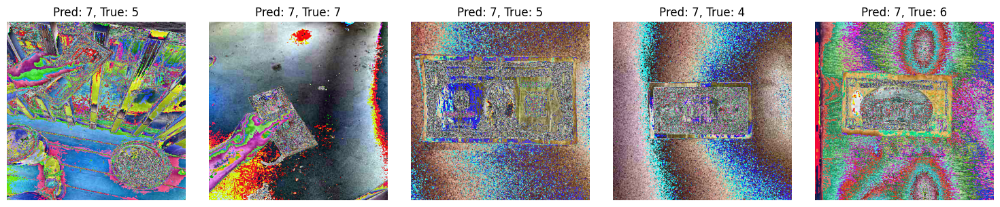

In [1]:

import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)  # dtype cambiado a long para CrossEntropyLoss

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 canales de entrada (RGB)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.fc2 = nn.Linear(128, 10)  # 10 clases de salida
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x

# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Función para entrenar el modelo

def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=3):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=3)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Desnormalizar y convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)


nuevo intento a ver si se soluciona porque se ven asi de feas 

Using device: cpu


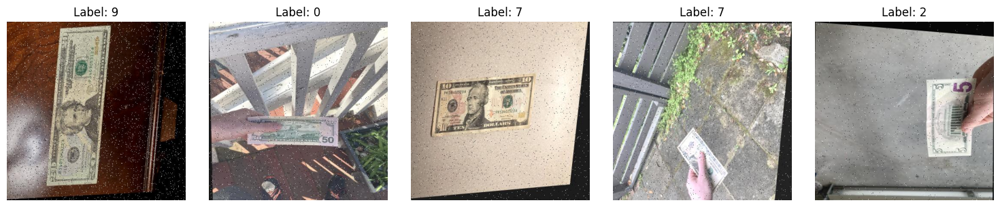

KeyboardInterrupt: 

In [7]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets con transformaciones
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 canales de entrada (RGB)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.fc2 = nn.Linear(128, 10)  # 10 clases de salida
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x

# Instanciar el modelo y moverlo a la GPU si está disponible
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, device, epochs=3):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device).float(), labels.to(device).long()
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device).float(), labels.to(device).long()
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, device, epochs=3)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device).float(), labels.to(device).long()
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image - image.min()) / (image.max() - image.min())  # Normalizar para visualización
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)


cuda available
Using device: cuda


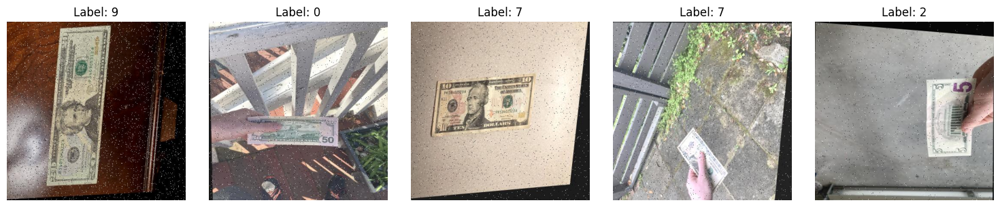

KeyboardInterrupt: 

In [2]:
#ESTE FUNCIONA BASTANTE BIEN!
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if (torch.cuda.is_available()):
    print("cuda available")
else: 
    print("cuda not available")
print(f'Using device: {device}')




# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 canales de entrada (RGB)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.fc2 = nn.Linear(128, 10)  # 10 clases de salida
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x

# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Función para entrenar el modelo

def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=20):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=20)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

Ahora vamos a probar uno con 50 epocas

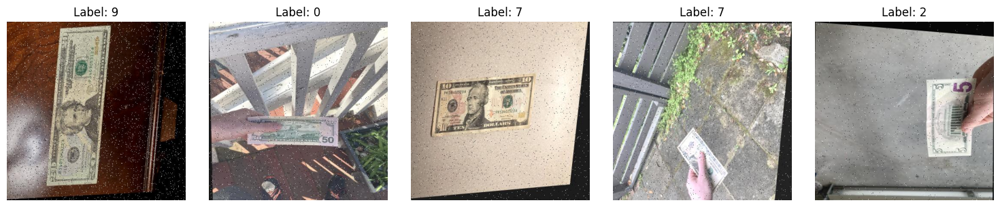

KeyboardInterrupt: 

In [3]:
# el loss de los datos de prueba bajan, eso es bueno. Val loss sube => overfitting. Acurracy sube => es bueno
# Epoch [1/50], Loss: 2.9226, Val Loss: 2.3093, Accuracy: 10.17%
# Epoch [2/50], Loss: 2.2915, Val Loss: 2.3270, Accuracy: 11.38%
# Epoch [3/50], Loss: 2.2890, Val Loss: 2.3224, Accuracy: 12.83%
# Epoch [4/50], Loss: 2.2513, Val Loss: 2.3789, Accuracy: 15.79%
# Epoch [5/50], Loss: 2.0939, Val Loss: 2.4381, Accuracy: 25.42%
# Epoch [6/50], Loss: 1.7949, Val Loss: 2.7457, Accuracy: 38.17%
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Verificar si CUDA está disponible
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f'Using device: {device}')
device = torch.device("cpu")

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 canales de entrada (RGB)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.fc2 = nn.Linear(128, 10)  # 10 clases de salida
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x

# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

        early_stopping(val_loss/len(val_loader.dataset))
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

vamos a agregar 
Dropout y L2 Regularization ayudan a prevenir el sobreajuste.
Early Stopping y Scheduler optimizan el entrenamiento y ajustan dinámicamente la tasa de aprendizaje.
Visualización te ayuda a evaluar la calidad de las predicciones del modelo.

Using device: cuda


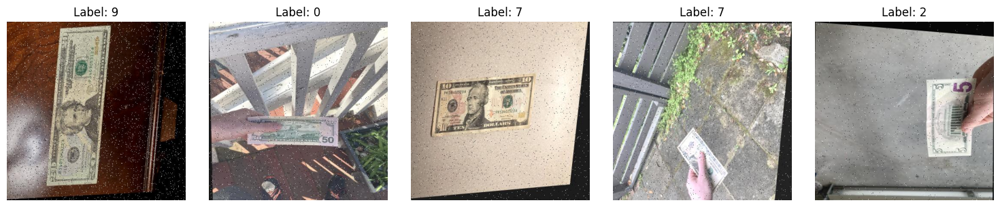

Epoch [1/50], Loss: 2.7921, Val Loss: 2.3093, Accuracy: 11.83%
Epoch [2/50], Loss: 2.2691, Val Loss: 2.3111, Accuracy: 13.50%


KeyboardInterrupt: 

In [1]:
# el loss de los datos de prueba bajan, eso es bueno. Val loss sube => overfitting. Acurracy sube => es bueno
#  ADUVO CON CUDA
# Epoch [1/50], Loss: 2.7921, Val Loss: 2.3093, Accuracy: 11.83%
# Epoch [2/50], Loss: 2.2691, Val Loss: 2.3111, Accuracy: 13.50%
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 canales de entrada (RGB)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.fc2 = nn.Linear(128, 10)  # 10 clases de salida
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.4)  # Dropout con tasa de 0.5
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)  # Aplicar Dropout aquí
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x


# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

        early_stopping(val_loss/len(val_loader.dataset))
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

Using device: cuda


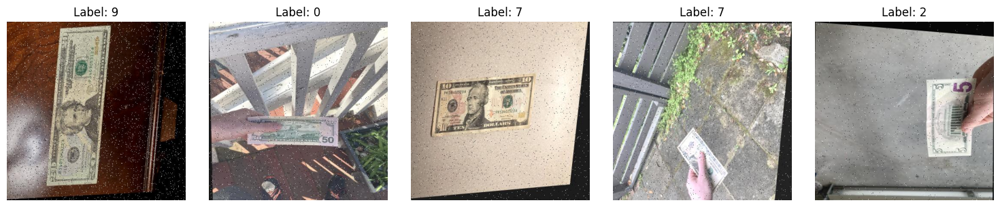

Epoch [1/50], Loss: 2.4087, Val Loss: 2.4067, Accuracy: 11.42%
Epoch [2/50], Loss: 2.2569, Val Loss: 2.4935, Accuracy: 16.42%
Epoch [3/50], Loss: 2.1665, Val Loss: 2.4144, Accuracy: 20.62%
Epoch [4/50], Loss: 2.0709, Val Loss: 2.5017, Accuracy: 25.88%
Epoch [5/50], Loss: 1.9600, Val Loss: 2.5396, Accuracy: 30.50%


KeyboardInterrupt: 

In [2]:
# el loss de los datos de prueba bajan, eso es bueno. Val loss sube => overfitting. Acurracy sube => es bueno
#    es copia del de arriba con algunas cosas mas 5.08.24
#  ADUVO CON CUDA - ESTE funciono re bien es el que le pase a manu

import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F 
# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])


# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # Cambiar a 32 canales de salida
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout(p=0.3)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)  # Cambiar el número de canales de entrada a 32
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout(p=0.4)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)  # Ajustar también el resto de capas
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout(p=0.3)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)  # Ajustar el tamaño según el tamaño final de las características
        self.bn4 = nn.BatchNorm1d(128)
        self.dropout4 = nn.Dropout(p=0.5)

        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.dropout1(x)
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.dropout2(x)
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))
        x = self.dropout3(x)
        x = self.flatten(x)
        x = F.relu(self.bn4(self.fc1(x)))
        x = self.dropout4(x)
        x = self.fc2(x)
        return x


# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
# Función para entrenar el modelo
# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.01)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader.dataset):.4f}, Val Loss: {val_loss/len(val_loader.dataset):.4f}, Accuracy: {100 * correct / total:.2f}%')

        early_stopping(val_loss/len(val_loader.dataset))
        if early_stopping.early_stop:
            print("Early stopping")
            break
# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

In [ ]:
como val loss sigue subiendo agrego L2 regularization

Using device: cuda


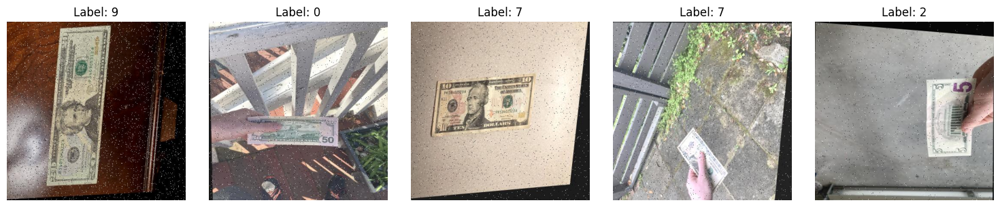

NameError: name 'transforms' is not defined

In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 52 * 52, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128, 10)
        self.dropout = nn.Dropout(p=0.5)
    
    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)  # No aplicamos softmax aquí porque CrossEntropyLoss lo hace internamente
        return x

# Instanciar el modelo, definir la pérdida y el optimizador
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader.dataset)
        train_accuracy = 100 * correct / total

        val_loss = 0.0
        val_correct = 0
        val_total = 0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss /= len(val_loader.dataset)
        val_accuracy = 100 * val_correct / val_total

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)


# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

usando resnet 

Using device: cuda


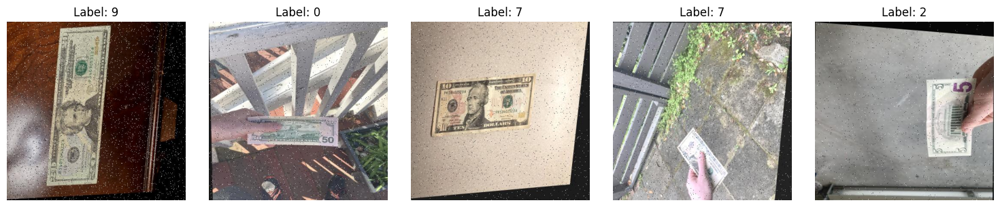

NameError: name 'transforms' is not defined

In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from torchvision import models

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (416, 416))
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(label, dtype=torch.long)

# Mostrar algunas imágenes sin transformaciones
def show_some_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        img, label = dataset[i]
        if isinstance(img, torch.Tensor):
            img = img.permute(1, 2, 0).numpy()  # Cambiar formato de imagen
        img = img.astype(np.uint8)  # Convertir a enteros de 8 bits sin desnormalizar
        axes[i].imshow(img)
        axes[i].set_title(f'Label: {label.item()}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Crear datasets sin transformaciones
train_dataset_raw = CustomDataset(train_dir, train_filenames, train_labels)
val_dataset_raw = CustomDataset(validation_dir, val_filenames, val_labels)
test_dataset_raw = CustomDataset(test_dir, test_filenames, test_labels)

# Mostrar algunas imágenes del dataset de entrenamiento sin transformaciones
show_some_images(train_dataset_raw, num_images=5)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo utilizando ResNet50 preentrenado
class BilleteClassifier(nn.Module):
    def __init__(self, num_classes=10):
        super(BilleteClassifier, self).__init__()
        # Cargar el modelo preentrenado ResNet50
        self.resnet = models.resnet50(pretrained=True)
        # Reemplazar la capa final para que coincida con el número de clases de salida
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

# Instanciar el modelo
model = BilleteClassifier(num_classes=10).to(device)

# Definir la función de pérdida y el optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            images = images.float()  # Asegúrate de que las imágenes sean tipo float
            labels = labels.long()  # Convertir etiquetas a tipo long
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)  # Calcula la pérdida
            loss.backward()  # Retropropagación
            optimizer.step()  # Actualiza los pesos
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader.dataset)
        train_accuracy = 100 * correct / total

        val_loss = 0.0
        val_correct = 0
        val_total = 0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
                images = images.float()  # Asegúrate de que las imágenes sean tipo float
                labels = labels.long()  # Convertir etiquetas a tipo long
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss /= len(val_loader.dataset)
        val_accuracy = 100 * val_correct / val_total

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)


# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
        images = images.float()  # Asegurarse de que las imágenes sean de tipo float
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)  # Mover al dispositivo
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0).float())  # Asegurarse de que las imágenes sean de tipo float
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Desnormalizar la imagen
            image = image.permute(1, 2, 0).cpu().numpy()  # Cambiar el formato de la imagen
            image = (image * 255).astype(np.uint8)  # Convertir a enteros de 8 bits
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

Using device: cuda


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\ferch/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100.0%


Epoch [1/50], Loss: 1.3284, Val Loss: 0.7639, Accuracy: 61.17%, Val Accuracy: 77.33%
Epoch [2/50], Loss: 0.1355, Val Loss: 0.4085, Accuracy: 99.42%, Val Accuracy: 89.33%
Epoch [3/50], Loss: 0.0298, Val Loss: 0.3351, Accuracy: 100.00%, Val Accuracy: 92.00%
Epoch [4/50], Loss: 0.0156, Val Loss: 0.3286, Accuracy: 100.00%, Val Accuracy: 93.33%
Epoch [5/50], Loss: 0.0112, Val Loss: 0.3412, Accuracy: 100.00%, Val Accuracy: 89.33%
Epoch [6/50], Loss: 0.0076, Val Loss: 0.2815, Accuracy: 100.00%, Val Accuracy: 90.67%
Epoch [7/50], Loss: 0.0062, Val Loss: 0.2991, Accuracy: 100.00%, Val Accuracy: 93.33%
Epoch [8/50], Loss: 0.0053, Val Loss: 0.2901, Accuracy: 100.00%, Val Accuracy: 90.67%
Epoch [9/50], Loss: 0.0043, Val Loss: 0.2993, Accuracy: 100.00%, Val Accuracy: 90.67%
Epoch [10/50], Loss: 0.0035, Val Loss: 0.2897, Accuracy: 100.00%, Val Accuracy: 90.67%
Epoch [11/50], Loss: 0.0034, Val Loss: 0.2614, Accuracy: 100.00%, Val Accuracy: 92.00%
Epoch [12/50], Loss: 0.0028, Val Loss: 0.2518, Accurac

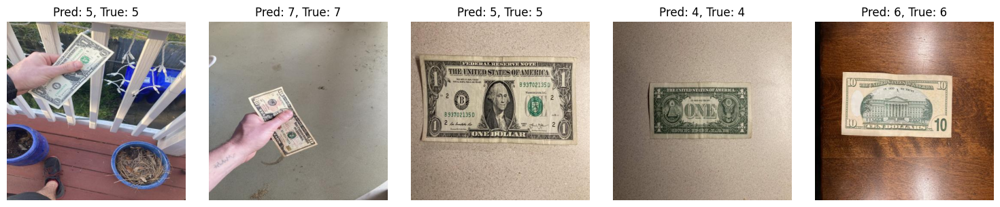

In [3]:
# ESTE ES EL QUE FUNCIONA!
# Epoch [22/50], Loss: 0.0011, Val Loss: 0.2413, Accuracy: 100.00%, Val Accuracy: 90.67%
# Epoch [23/50], Loss: 0.0010, Val Loss: 0.2665, Accuracy: 100.00%, Val Accuracy: 92.00%
# Epoch [24/50], Loss: 0.0010, Val Loss: 0.2524, Accuracy: 100.00%, Val Accuracy: 92.00%
# Early stopping
# Test Accuracy: 95.45454545454545%

import os
import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torchvision.models import resnet18, ResNet18_Weights
from PIL import Image

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#device = torch.device("cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
train_dir = './train'
validation_dir = './valid'
test_dir = './test'

# Función para cargar las etiquetas desde los archivos CSV
def load_labels(csv_path):
    df = pd.read_csv(csv_path)
    filenames = df['filename'].values
    labels = df.drop('filename', axis=1).values
    return filenames, labels

# Cargar etiquetas
train_filenames, train_labels = load_labels(os.path.join(train_dir, '_classes.csv'))
val_filenames, val_labels = load_labels(os.path.join(validation_dir, '_classes.csv'))
test_filenames, test_labels = load_labels(os.path.join(test_dir, '_classes.csv'))

# Convertir etiquetas one-hot a índices de clase
def one_hot_to_label(one_hot_labels):
    return np.argmax(one_hot_labels, axis=1)

train_labels = one_hot_to_label(train_labels)
val_labels = one_hot_to_label(val_labels)
test_labels = one_hot_to_label(test_labels)

# Dataset personalizado de PyTorch
# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, directory, filenames, labels, transform=None):
        self.directory = directory
        self.filenames = filenames
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.filenames[idx])
        image = cv2.imread(img_name)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)  # Convertir de numpy.ndarray a PIL.Image
        if self.transform:
            image = self.transform(image)
        label = self.labels[idx]
        
        return image, torch.tensor(label, dtype=torch.long)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.Resize((416, 416)),  # Cambiar tamaño de las imágenes a 416x416
    transforms.ToTensor(),          # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear datasets
train_dataset = CustomDataset(train_dir, train_filenames, train_labels, transform=transform)
val_dataset = CustomDataset(validation_dir, val_filenames, val_labels, transform=transform)
test_dataset = CustomDataset(test_dir, test_filenames, test_labels, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Definir la arquitectura del modelo utilizando ResNet50 preentrenado

# Definir la arquitectura del modelo utilizando ResNet18 preentrenado
class BilleteClassifier(nn.Module):
    def __init__(self, num_classes=10):
        super(BilleteClassifier, self).__init__()
        # Cargar el modelo preentrenado ResNet18
        self.resnet = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        # Reemplazar la capa final para que coincida con el número de clases de salida
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)

    def forward(self, x):
        return self.resnet(x)
# Instanciar el modelo
model = BilleteClassifier(num_classes=10).to(device)

# Definir la función de pérdida y el optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader.dataset)
        train_accuracy = 100 * correct / total

        val_loss = 0.0
        val_correct = 0
        val_total = 0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss /= len(val_loader.dataset)
        val_accuracy = 100 * val_correct / val_total

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetes.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0))
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
            image = image.permute(1, 2, 0).cpu().numpy()
            image = (image * 255).astype(np.uint8)
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

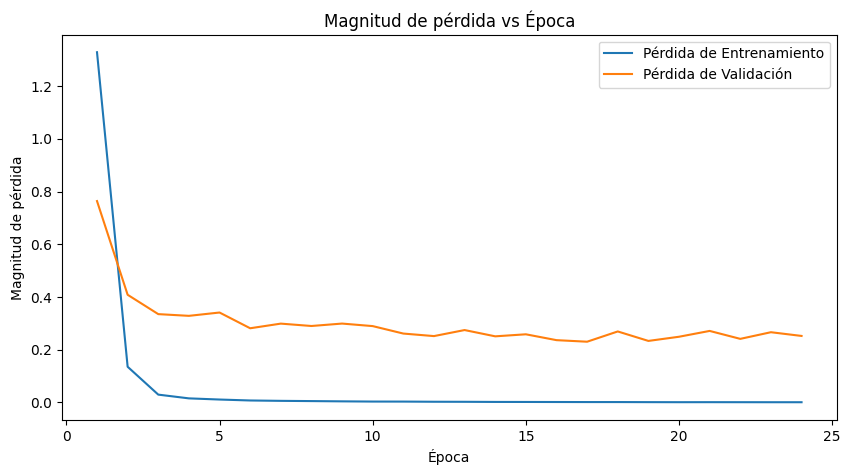

In [2]:
import matplotlib.pyplot as plt

# Resultados de entrenamiento simulados
epochs = list(range(1, 25))
loss = [1.3284, 0.1355, 0.0298, 0.0156, 0.0112, 0.0076, 0.0062, 0.0053, 0.0043, 0.0035, 
        0.0034, 0.0028, 0.0026, 0.0021, 0.0020, 0.0018, 0.0016, 0.0016, 0.0013, 0.0011, 
        0.0012, 0.0011, 0.0010, 0.0010]
val_loss = [0.7639, 0.4085, 0.3351, 0.3286, 0.3412, 0.2815, 0.2991, 0.2901, 0.2993, 0.2897,
            0.2614, 0.2518, 0.2747, 0.2509, 0.2586, 0.2364, 0.2305, 0.2694, 0.2335, 0.2493,
            0.2714, 0.2413, 0.2665, 0.2524]

# Crear la figura y los ejes
plt.figure(figsize=(10, 5))

# Plotear el loss
plt.plot(epochs, loss, label='Pérdida de Entrenamiento')
plt.plot(epochs, val_loss, label='Pérdida de Validación')

# Añadir títulos y etiquetas
plt.title('Magnitud de pérdida vs Época')
plt.xlabel('Época')
plt.ylabel('Magnitud de pérdida')
plt.legend()

# Mostrar el gráfico
plt.show()


#probamos el modelo

In [8]:
def predict_image(image_path, model, transform, device):
    # Cargar la imagen
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Failed to load image at path: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(image)

    # Aplicar transformaciones
    image = transform(image)
    image = image.unsqueeze(0)  # Añadir batch dimension

    # Mover la imagen al dispositivo (CPU/GPU)
    image = image.to(device)

    # Poner el modelo en modo evaluación
    model.eval()
    with torch.no_grad():
        # Obtener predicción
        output = model(image)
        _, predicted = torch.max(output.data, 1)
    
    return predicted.item()

# Ruta de la imagen a predecir
image_path = './test/IMG_1909_jpg.rf.3f2bde8dc899b141a4361677e55242e4.jpg'

# Realizar la predicción
predicted_class = predict_image(image_path, model, transform, device)

print(f'Predicted class: {predicted_class}')


#tener en cuenta que las clases van de 0 a 9 si son 10


Predicted class: 8


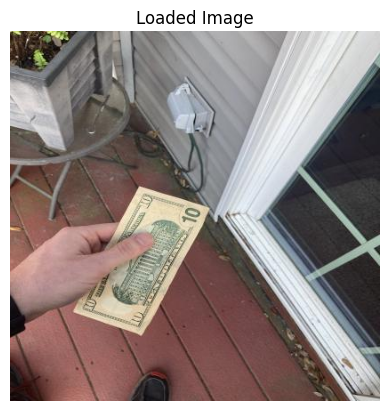

Dimensions of the image: Height=416, Width=416, Channels=3
Mean of the image channels: [134.84017312 121.39843172 118.50377335]
Standard deviation of the image channels: [56.49224119 60.88064431 61.46773305]


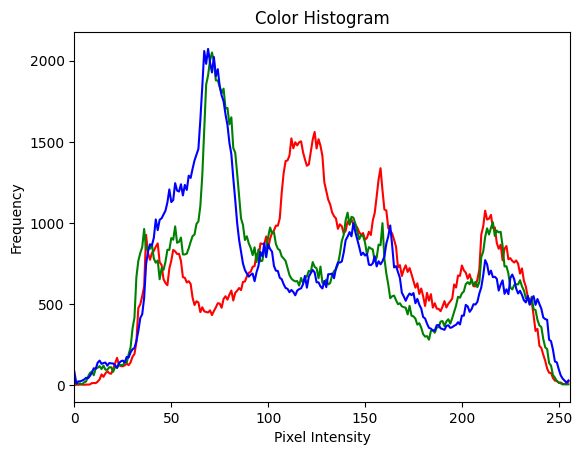

In [4]:
#ver datos de la imagen 
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Ruta de la imagen cargada
image_path = 'C:\\Users\\ferch\\OneDrive\\Documentos\\Fer\\facultad TODO\\tesis\\cnnsApp\\test\\IMG_2218_jpeg.rf.d3dd69e973b90fa0e5fa2080239f0004.jpg'

# Cargar la imagen
image = cv2.imread(image_path)

# Verificar si la imagen se cargó correctamente
if image is None:
    raise FileNotFoundError(f"Failed to load image at path: {image_path}")

# Convertir la imagen de BGR (formato de OpenCV) a RGB (formato de matplotlib)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Mostrar la imagen y sus características
plt.imshow(image_rgb)
plt.title('Loaded Image')
plt.axis('off')
plt.show()

# Mostrar las dimensiones de la imagen
height, width, channels = image.shape
print(f"Dimensions of the image: Height={height}, Width={width}, Channels={channels}")

# Revisar la media y desviación estándar de los canales de color
mean = np.mean(image_rgb, axis=(0, 1))
std = np.std(image_rgb, axis=(0, 1))
print(f"Mean of the image channels: {mean}")
print(f"Standard deviation of the image channels: {std}")

# Mostrar histograma de los canales de color
colors = ('r', 'g', 'b')
for i, color in enumerate(colors):
    hist = cv2.calcHist([image_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
    plt.xlim([0, 256])
plt.title('Color Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()


PESOS! el de abajo funciona 27/10/24

Using device: cpu
Clases: ['10000DBelgrano', '10000FBelgrano', '1000DHornero', '1000DSanMartin', '1000FHornero', '1000FSanMartin', '100DEvita', '100DRoca', '100DTaruca', '100FEvita', '100FRoca', '100FTaruca', '10DBelgranoNuevo', '10DBelgranoViejo', '10FBelgranoNuevo', '10FBelgranoViejo', '2000DGriersonCarrillo', '2000FGriersonCarrillo', '200DBallena', '200FBallena', '20DGuanaco', '20DRosas', '20FGuanaco', '20FRosas', '500DYaguarete', '500FYaguarete', '50DCondor', '50DMalvinas', '50DSarmiento', '50FCondor', '50FMalvinas', '50FSarmiento', 'fiftyback', 'fiftyfront', 'fiveback', 'fivefront', 'oneback', 'onefront', 'tenback', 'tenfront', 'twentyback', 'twentyfront']


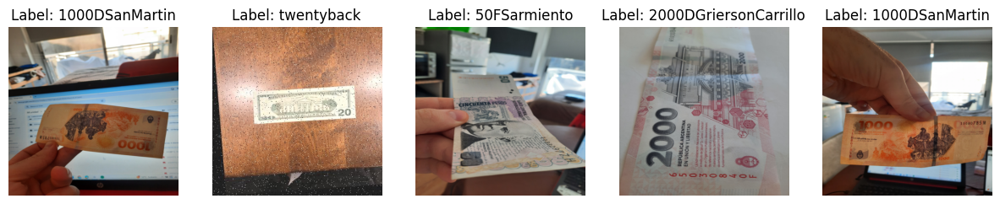

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


: 

In [17]:
import os
# import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torchvision.models import resnet18, ResNet18_Weights
from PIL import Image

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#device = torch.device("cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
dataset_dir = './billetes'

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.classes)}

        for cls_name in self.classes:
            cls_folder = os.path.join(root_dir, cls_name)
            for img_name in os.listdir(cls_folder):
                self.image_paths.append(os.path.join(cls_folder, img_name))
                self.labels.append(self.class_to_idx[cls_name])
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)  # Convertir de numpy.ndarray a PIL.Image
        if self.transform:
            image = self.transform(image)
        label = self.labels[idx]
        return image, torch.tensor(label, dtype=torch.long)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.Resize((416, 416)),  # Cambiar tamaño de las imágenes a 416x416
    transforms.ToTensor(),          # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear dataset
dataset = CustomDataset(dataset_dir, transform=transform)

# Dividir el dataset en entrenamiento, validación y prueba
train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=42, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=42, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=42, shuffle=False)

# mostramos algunas imagenes 
import matplotlib.pyplot as plt

# Función para desnormalizar las imágenes
def denormalizeShow(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes
def show_images(dataset, num_images=5, original_dataset=None):
    fig = plt.figure(figsize=(15, 3))
    
    # Si se proporciona el dataset original, usa sus clases
    if original_dataset:
        classes = original_dataset.classes
    else:
        classes = dataset.dataset.classes  # Accede a las clases a través del dataset Subset
    
    for i in range(num_images):
        idx = np.random.randint(0, len(dataset))
        image, label = dataset[idx]
        
        # Desnormalizar la imagen
        image = denormalizeShow(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        image = image.permute(1, 2, 0).numpy()
        
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image)
        plt.title(f'Label: {classes[label]}')
        plt.axis('off')
    
    plt.show()

# Ahora, cuando llames a la función, proporciona también el dataset original
show_images(train_dataset, num_images=5, original_dataset=dataset)






# Definir la arquitectura del modelo utilizando ResNet18 preentrenado
class BilleteClassifier(nn.Module):
    def __init__(self, num_classes=42):
        super(BilleteClassifier, self).__init__()
        # Cargar el modelo preentrenado ResNet18
        self.resnet = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        # Reemplazar la capa final para que coincida con el número de clases de salida
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)

    def forward(self, x):
        return self.resnet(x)
# Instanciar el modelo
model = BilleteClassifier(num_classes=42).to(device)

# Definir la función de pérdida y el optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Early stopping
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
        elif val_loss >= self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Función para entrenar el modelo
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    early_stopping = EarlyStopping(patience=7, min_delta=0.001)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader.dataset)
        train_accuracy = 100 * correct / total

        val_loss = 0.0
        val_correct = 0
        val_total = 0
        model.eval()
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss /= len(val_loader.dataset)
        val_accuracy = 100 * val_correct / val_total

        print(f'Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping")
            break

# Entrenar el modelo
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=50)

# Evaluar el modelo en el conjunto de prueba
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Test Accuracy: {}%'.format(100 * correct / total))

# Guardar el modelo
torch.save(model.state_dict(), 'modelo_billetesPesos.pth')

# Función para desnormalizar las imágenes
def denormalize(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes y etiquetas predichas
def show_predictions(loader, model, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    model.eval()
    with torch.no_grad():
        for i in range(num_images):
            images, labels = next(iter(loader))
            images, labels = images.to(device), labels.to(device)
            image = images[i]
            label = labels[i]
            pred = model(image.unsqueeze(0))
            pred_label = torch.argmax(pred).item()
            image = denormalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
            image = image.permute(1, 2, 0).cpu().numpy()
            image = (image * 255).astype(np.uint8)
            axes[i].imshow(image)
            axes[i].set_title(f'Pred: {pred_label}, True: {label.item()}')
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones del conjunto de prueba
show_predictions(test_loader, model, num_images=5)

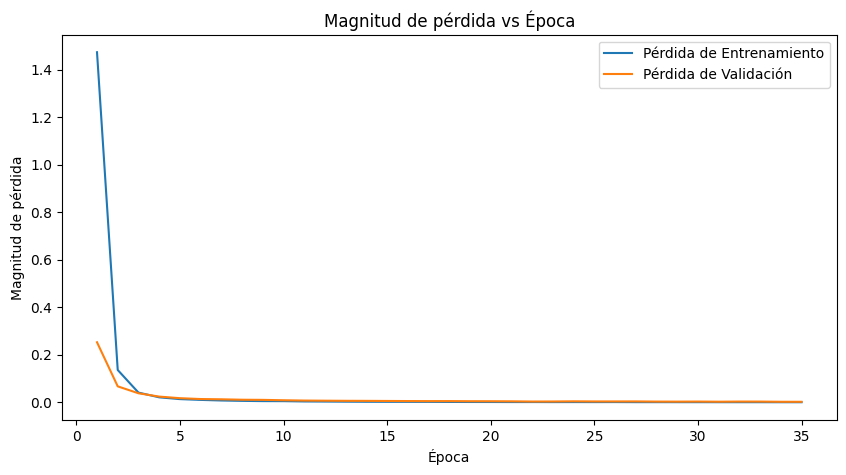

In [1]:
import matplotlib.pyplot as plt

# Resultados de entrenamiento simulados
epochs = list(range(1, 36))
loss = [1.4738, 0.1361, 0.0410, 0.0210, 0.0135, 0.0102, 0.0077, 0.0061, 0.0051, 0.0049, 
        0.0036, 0.0032, 0.0027, 0.0023, 0.0021, 0.0020, 0.0019, 0.0016, 0.0014, 0.0013, 
        0.0011, 0.0011, 0.0009, 0.0010, 0.0009, 0.0010, 0.0007, 0.0007, 0.0006, 0.0006, 
        0.0005, 0.0005, 0.0005, 0.0004, 0.0004]
val_loss = [0.2528, 0.0672, 0.0381, 0.0241, 0.0174, 0.0138, 0.0127, 0.0109, 0.0103, 0.0087,
            0.0074, 0.0068, 0.0063, 0.0061, 0.0057, 0.0053, 0.0050, 0.0051, 0.0046, 0.0045,
            0.0042, 0.0033, 0.0035, 0.0042, 0.0037, 0.0037, 0.0038, 0.0031, 0.0029, 0.0032,
            0.0026, 0.0032, 0.0031, 0.0023, 0.0022]

# Crear la figura y los ejes
plt.figure(figsize=(10, 5))

# Plotear el loss
plt.plot(epochs, loss, label='Pérdida de Entrenamiento')
plt.plot(epochs, val_loss, label='Pérdida de Validación')

# Añadir títulos y etiquetas
plt.title('Magnitud de pérdida vs Época')
plt.xlabel('Época')
plt.ylabel('Magnitud de pérdida')
plt.legend()

# Mostrar el gráfico
plt.show()


Using device: cuda


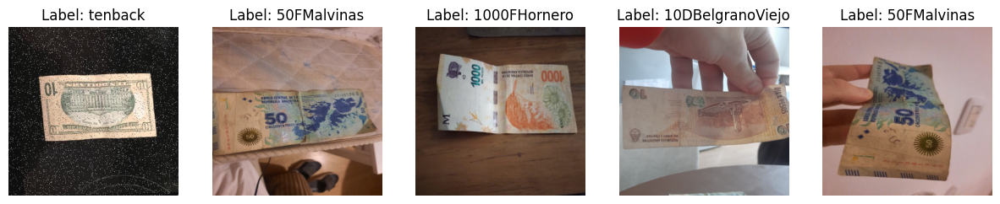

Mapeo de clases a índices:
Clase 0: 10000DBelgrano
Clase 1: 10000FBelgrano
Clase 2: 1000DHornero
Clase 3: 1000DSanMartin
Clase 4: 1000FHornero
Clase 5: 1000FSanMartin
Clase 6: 100DEvita
Clase 7: 100DRoca
Clase 8: 100DTaruca
Clase 9: 100FEvita
Clase 10: 100FRoca
Clase 11: 100FTaruca
Clase 12: 10DBelgranoNuevo
Clase 13: 10DBelgranoViejo
Clase 14: 10FBelgranoNuevo
Clase 15: 10FBelgranoViejo
Clase 16: 2000DGriersonCarrillo
Clase 17: 2000FGriersonCarrillo
Clase 18: 200DBallena
Clase 19: 200FBallena
Clase 20: 20DGuanaco
Clase 21: 20DRosas
Clase 22: 20FGuanaco
Clase 23: 20FRosas
Clase 24: 500DYaguarete
Clase 25: 500FYaguarete
Clase 26: 50DCondor
Clase 27: 50DMalvinas
Clase 28: 50DSarmiento
Clase 29: 50FCondor
Clase 30: 50FMalvinas
Clase 31: 50FSarmiento
Clase 32: fiftyback
Clase 33: fiftyfront
Clase 34: fiveback
Clase 35: fivefront
Clase 36: oneback
Clase 37: onefront
Clase 38: tenback
Clase 39: tenfront
Clase 40: twentyback
Clase 41: twentyfront


In [7]:
import os
# import pandas as pd
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torchvision.models import resnet18, ResNet18_Weights
from PIL import Image

# Verificar si CUDA está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#device = torch.device("cpu")
print(f'Using device: {device}')

# Directorios del dataset (relativos al directorio actual del script)
dataset_dir = './billetes'

# Dataset personalizado de PyTorch
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.classes)}

        for cls_name in self.classes:
            cls_folder = os.path.join(root_dir, cls_name)
            for img_name in os.listdir(cls_folder):
                self.image_paths.append(os.path.join(cls_folder, img_name))
                self.labels.append(self.class_to_idx[cls_name])
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Failed to load image at path: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)  # Convertir de numpy.ndarray a PIL.Image
        if self.transform:
            image = self.transform(image)
        label = self.labels[idx]
        return image, torch.tensor(label, dtype=torch.long)

# Transformaciones para los datos
transform = transforms.Compose([
    transforms.Resize((416, 416)),  # Cambiar tamaño de las imágenes a 416x416
    transforms.ToTensor(),          # Convertir imágenes a tensores
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar imágenes
])

# Crear dataset
dataset = CustomDataset(dataset_dir, transform=transform)

# Dividir el dataset en entrenamiento, validación y prueba
train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=42, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=42, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=42, shuffle=False)

# mostramos algunas imagenes 
import matplotlib.pyplot as plt

# Función para desnormalizar las imágenes
def denormalizeShow(image, mean, std):
    img = image.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# Función para mostrar imágenes
def show_images(dataset, num_images=5, original_dataset=None):
    fig = plt.figure(figsize=(15, 3))
    
    # Si se proporciona el dataset original, usa sus clases
    if original_dataset:
        classes = original_dataset.classes
    else:
        classes = dataset.dataset.classes  # Accede a las clases a través del dataset Subset
    
    for i in range(num_images):
        idx = np.random.randint(0, len(dataset))
        image, label = dataset[idx]
        
        # Desnormalizar la imagen
        image = denormalizeShow(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        image = image.permute(1, 2, 0).numpy()
        
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image)
        plt.title(f'Label: {classes[label]}')
        plt.axis('off')
    
    plt.show()

# Ahora, cuando llames a la función, proporciona también el dataset original
show_images(train_dataset, num_images=5, original_dataset=dataset)


print("Mapeo de clases a índices:")
for cls_name, idx in dataset.class_to_idx.items():
    print(f"Clase {idx}: {cls_name}")